In [1]:
import TestImages: testimage
import ImageView: imshow

img = testimage("mandrill")
(xsize, ysize) = size(img)

(512, 512)

In [2]:
function warp(x, y, p)
    xcenter = p[:xcenter]
    ycenter = p[:ycenter]
    distance = sqrt((xcenter-x)^2 + (ycenter-y)^2)
    mod_ = 0.25*sin(p[:distance_coef]*(distance/(p[:time]+p[:shift]+0.1)))+0.75
    g(xcenter, x) = xcenter + (x - xcenter)*mod_
    xnew = g(xcenter, x)
    ynew = g(ycenter, y)
    xnew, ynew
end

warp (generic function with 1 method)

In [3]:
function apply_warp(warp, im, p)
    (xsize, ysize) = size(im)
    p[:xsize] = xsize
    p[:ysize] = ysize
    function linear_interpolation(x_y)
        # a rough draft, this can be improved; works on im
        x = x_y[1]
        y = x_y[2]
        dx=mod(x,1)
        dy=mod(y,1)
        x_left = floor(Int,x)
        y_left = floor(Int,y)
        x_right = min(x_left + 1, xsize)
        y_right = min(y_left + 1, ysize)
        im[x_left,y_left]*(1-dx)*(1-dy) + im[x_left,y_right]*(1-dx)*dy + im[x_right,y_left]*dx*(1-dy) + im[x_right, y_right]*dx*dy
    end
    [linear_interpolation(warp(x,y,p)) for x in 1:xsize, y in 1:ysize]
end

apply_warp (generic function with 1 method)

In [4]:
params = Dict(:distance_coef=>0.8, :xcenter=>61, :ycenter=>176)
params[:time] = 2
params[:shift] = params[:time]/(1+0.01*params[:time])
params

Dict{Symbol, Real} with 5 entries:
  :shift         => 1.96078
  :distance_coef => 0.8
  :xcenter       => 61
  :ycenter       => 176
  :time          => 2

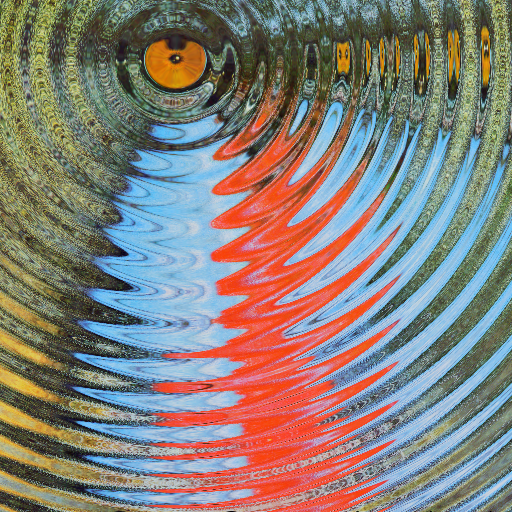

In [5]:
apply_warp(warp, img, params)

,,,,,,,,,,,,,,,,,,,,,,,,,,,

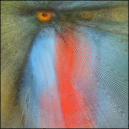
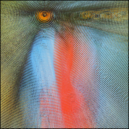
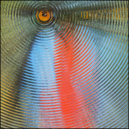
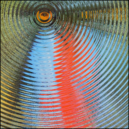
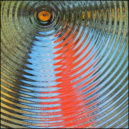
...
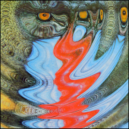
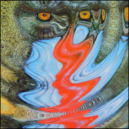
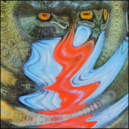
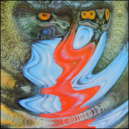
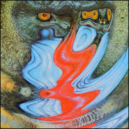

In [7]:
imgs = [apply_warp(warp, img, params) for params[:time] in 0:1/3:9
                   for params[:shift] in [params[:time]/(1+0.01*params[:time])]]

In [8]:
zsize = length(imgs)

28

In [9]:
using FileIO

full_imgs = []
for i in 1:zsize
    push!(full_imgs, imgs[i])
end
for i in reverse(2:(zsize-1))
    push!(full_imgs, imgs[i])
end

save("exersize2.gif", cat(full_imgs..., dims=3), fps=30)

,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,

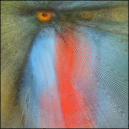
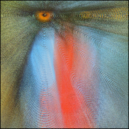
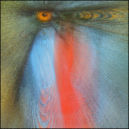
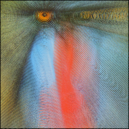
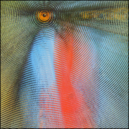
...
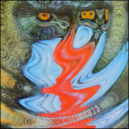
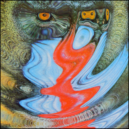
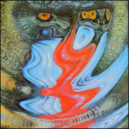
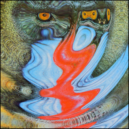
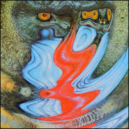

In [10]:
imgs_long = [apply_warp(warp, img, params) for params[:time] in 0:0.1:9
                   for params[:shift] in [params[:time]/(1+0.01*params[:time])]]

In [12]:
zsize = length(imgs_long)

91

In [13]:
full_imgs_long = []
for i in 1:zsize
    push!(full_imgs_long, imgs_long[i])
end
for i in reverse(2:(zsize-1))
    push!(full_imgs_long, imgs_long[i])
end

save("exersize2_long.gif", cat(full_imgs_long..., dims=3), fps=30)

,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,

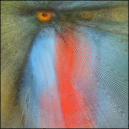
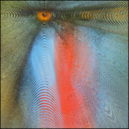
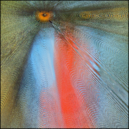
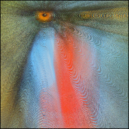
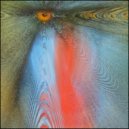
...
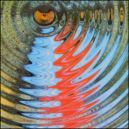
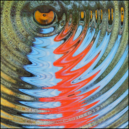
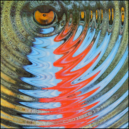
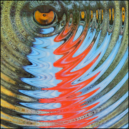
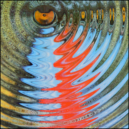

In [14]:
imgs_init = [apply_warp(warp, img, params) for params[:time] in 0:0.02:3
                   for params[:shift] in [params[:time]/(1+0.01*params[:time])]]

In [15]:
zsize = length(imgs_init)

151

In [16]:
full_imgs_init = []
for i in 1:zsize
    push!(full_imgs_init, imgs_init[i])
end
for i in reverse(2:(zsize-1))
    push!(full_imgs_init, imgs_init[i])
end

save("exersize2_init.gif", cat(full_imgs_init..., dims=3), fps=30)